In [ ]:
Install required packages

In [17]:
pip install numpy pandas matplotlib seaborn scikit-learn imbalanced-learn lime

Note: you may need to restart the kernel to use updated packages.


Importing Libraries:This section imports essential libraries required for data manipulation, visualization, model training, evaluation, and interpretation. Each library serves a specific purpose in the data analysis and machine learning pipeline.

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score, precision_recall_curve
from imblearn.under_sampling import TomekLinks
from imblearn.over_sampling import SMOTE
import pickle
import lime
import lime.lime_tabular
import warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names")

Setting Environment Variable: 
This code sets an environment variable that limits the maximum number of CPU cores used by certain processes. This can be important for controlling resource usage and preventing overloading the system.

In [19]:
# Set LOKY_MAX_CPU_COUNT environment variable
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "2"

Loading Dataset: 
This part loads the dataset into a Pandas DataFrame, which is a fundamental step in any data analysis or machine learning task. Understanding the structure and content of the data is crucial for further analysis.

In [20]:
# Load the dataset
df = pd.read_csv("C:/Users/sowjanya/Desktop/credit_card_fraud_detection/creditcard.csv")

Displaying Information: 
Printing the shape, missing values, summary statistics, and data types of the dataset provides essential insights into its characteristics, helping to understand its structure and identify potential issues such as missing values or data types mismatch.

In [21]:
# Displaying additional information
print("DataFrame shape:")
print(df.shape)
print()

print("Total missing values:")
print(df.isnull().sum().sum())
print()

print("Summary Statistics:")
print(df.describe())
print()

print("Data types:")
print(df.dtypes)
print()

DataFrame shape:
(284807, 31)

Total missing values:
0

Summary Statistics:
                Time            V1            V2            V3            V4  \
count  284807.000000  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean    94813.859575  1.759061e-12 -8.251130e-13 -9.654937e-13  8.321385e-13   
std     47488.145955  1.958696e+00  1.651309e+00  1.516255e+00  1.415869e+00   
min         0.000000 -5.640751e+01 -7.271573e+01 -4.832559e+01 -5.683171e+00   
25%     54201.500000 -9.203734e-01 -5.985499e-01 -8.903648e-01 -8.486401e-01   
50%     84692.000000  1.810880e-02  6.548556e-02  1.798463e-01 -1.984653e-02   
75%    139320.500000  1.315642e+00  8.037239e-01  1.027196e+00  7.433413e-01   
max    172792.000000  2.454930e+00  2.205773e+01  9.382558e+00  1.687534e+01   

                 V5            V6            V7            V8            V9  \
count  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean   1.649999e-13  4.248366e-13 -3.054600e-

In [22]:
# Standardize the 'Amount' and 'Time' columns
ss = StandardScaler()
df['Amount'] = ss.fit_transform(df[['Amount']])
df['Time'] = ss.fit_transform(df[['Time']])

Boxplot Visualization: Boxplots provide a visual summary of the distribution of each feature, particularly in relation to the target variable. This visualization helps identify potential outliers and understand the differences in feature distributions between different classes.

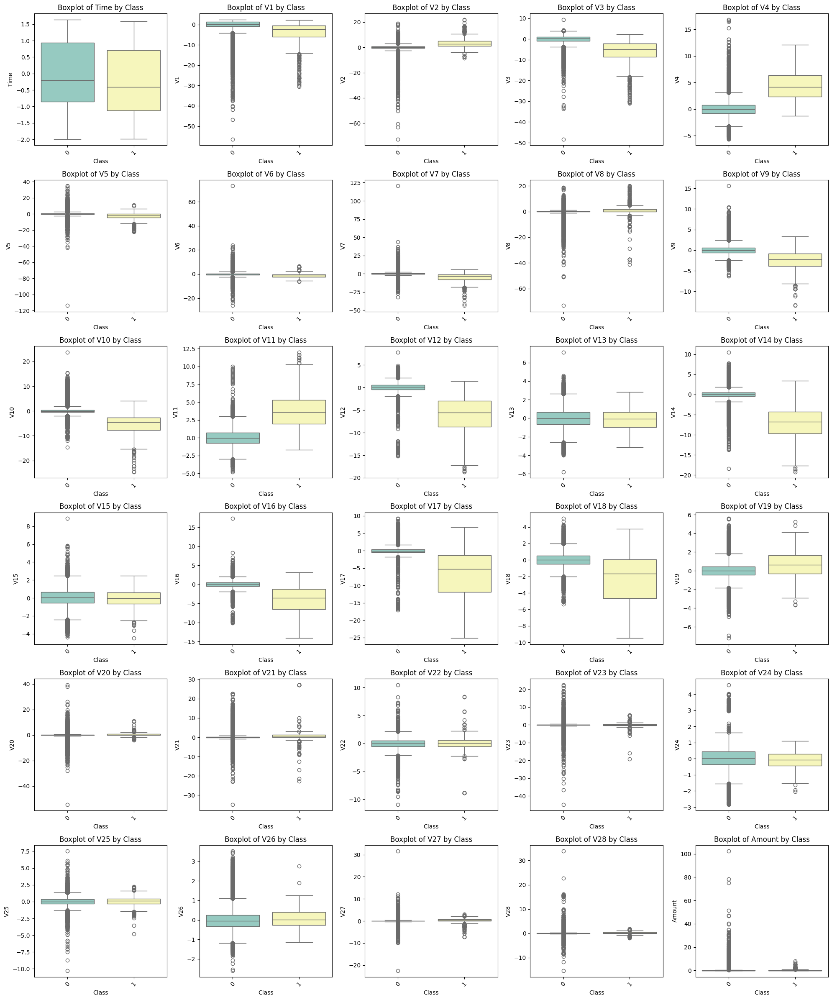

In [48]:
# Boxplot for each feature
num_features = len(df.columns[:-1])
num_cols = 5
num_rows = (num_features + num_cols - 1) // num_cols

plt.figure(figsize=(20, 4 * num_rows))  # Adjust the figure size based on the number of features
for i, var in enumerate(df.columns[:-1], 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(x='Class', y=var, data=df, hue='Class', palette='Set3', legend=False)
    plt.title(f'Boxplot of {var} by Class')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

Preparing Data for Modeling: 
This step involves separating the dataset into features (X) and the target variable (y), which is essential for training supervised machine learning models.

In [24]:
# Prepare data for modeling
X = df.drop(columns=['Class'])
y = df['Class']

Splitting Data: Splitting the data into training and testing sets allows for unbiased evaluation of the model's performance on unseen data. This helps assess how well the model generalizes to new data.

In [25]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Model Training:Training various machine learning models, including Logistic Regression, Decision Tree, and Artificial Neural Network (ANN), is the core of the predictive modeling process. 
Different algorithms may capture different aspects of the data, and training multiple models allows for comparison and selection of the best-performing one.

In [26]:
# Define and train Logistic Regression Model
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

In [27]:
# Define and train Decision Tree Model
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
y_pred_decision_tree = dt_model.predict(X_test)

In [28]:
# Define and train ANN Model
ann_model = MLPClassifier(hidden_layer_sizes=(16, 8), max_iter=1000)  # Example architecture, adjust as needed
ann_model.fit(X_train, y_train)
y_pred_ann = ann_model.predict(X_test)

Plotting Confusion Matrix: Confusion matrices provide a detailed view of the model's performance by showing the counts of true positive, true negative, false positive, and false negative predictions. 
Visualizing confusion matrices helps in assessing the model's accuracy, precision, recall, and F1 score.

In [29]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    cf_matrix = confusion_matrix(y_true, y_pred)

    sns.heatmap(cf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

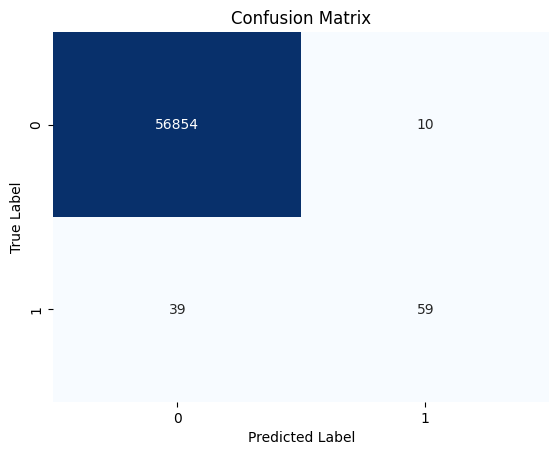

In [30]:
# Plot confusion matrix for Logistic Regression
plot_confusion_matrix(y_test, y_pred_lr)
# Evaluate Logistic Regression Model
lr_accuracy = accuracy_score(y_test, y_pred_lr)
lr_precision = precision_score(y_test, y_pred_lr)
lr_recall = recall_score(y_test, y_pred_lr)
lr_f1_score = f1_score(y_test, y_pred_lr)

In [31]:
print("Logistic Regression Metrics:")
print(f"Accuracy: {lr_accuracy}")
print(f"Precision: {lr_precision}")
print(f"Recall: {lr_recall}")
print(f"F1 Score: {lr_f1_score}")

Logistic Regression Metrics:
Accuracy: 0.9991397773954567
Precision: 0.855072463768116
Recall: 0.6020408163265306
F1 Score: 0.7065868263473054


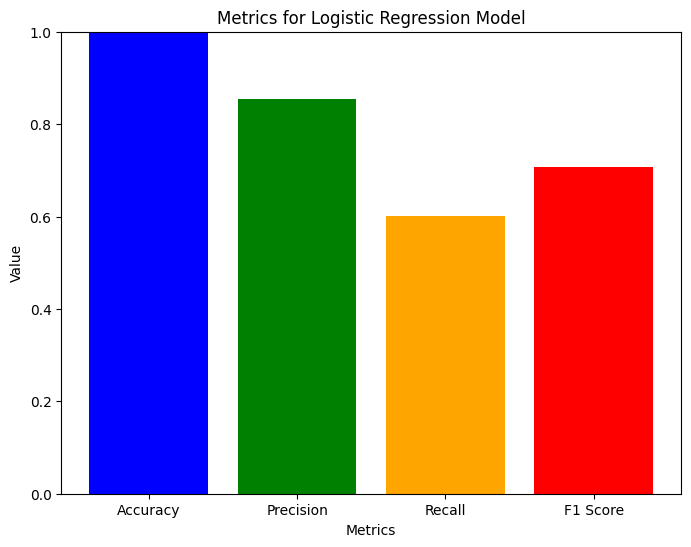

In [32]:
# Metrics values
lr_metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
lr_values = [lr_accuracy, lr_precision, lr_recall, lr_f1_score]  # Assuming you have these metrics calculated

# Plotting for Logistic Regression
plt.figure(figsize=(8, 6))
plt.bar(lr_metrics, lr_values, color=['blue', 'green', 'orange', 'red'])
plt.title('Metrics for Logistic Regression Model')
plt.xlabel('Metrics')
plt.ylabel('Value')
plt.ylim(0, 1)  # Limit y-axis to range between 0 and 1
plt.show()

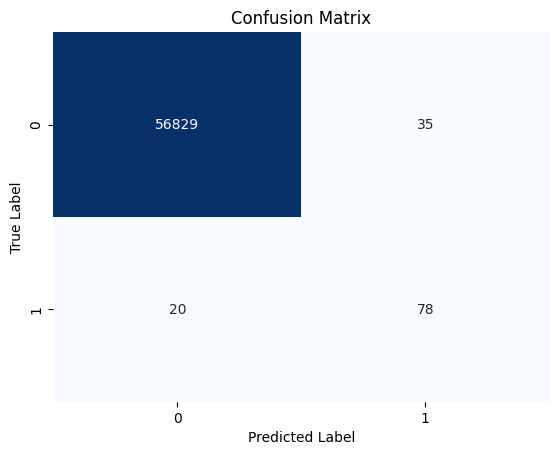

In [33]:
# Plot confusion matrix for Decision Tree
plot_confusion_matrix(y_test, y_pred_decision_tree)
# Evaluate Decision Tree Model
dt_accuracy = accuracy_score(y_test, y_pred_decision_tree)
dt_precision = precision_score(y_test, y_pred_decision_tree)
dt_recall = recall_score(y_test, y_pred_decision_tree)
dt_f1_score = f1_score(y_test, y_pred_decision_tree)

In [34]:
print("\nDecision Tree Metrics:")
print(f"Accuracy: {dt_accuracy}")
print(f"Precision: {dt_precision}")
print(f"Recall: {dt_recall}")
print(f"F1 Score: {dt_f1_score}")


Decision Tree Metrics:
Accuracy: 0.9990344440153085
Precision: 0.6902654867256637
Recall: 0.7959183673469388
F1 Score: 0.7393364928909952


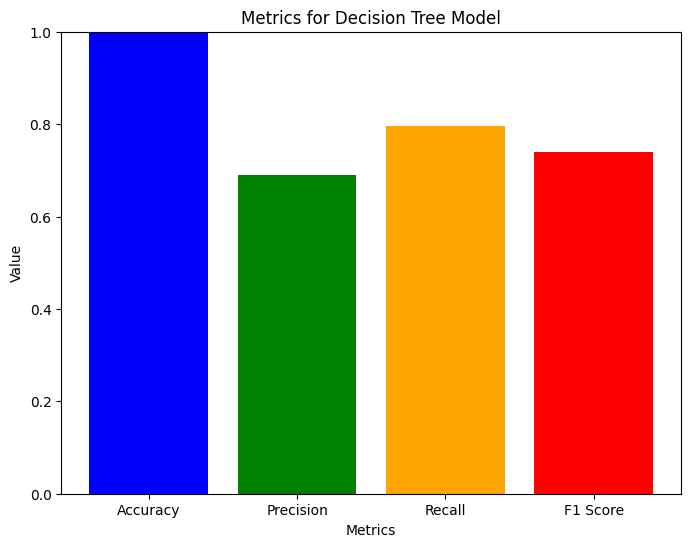

In [35]:
# Metrics values
dt_metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
dt_values = [dt_accuracy, dt_precision, dt_recall, dt_f1_score]  # Assuming you have these metrics calculated

# Plotting for Decision Tree
plt.figure(figsize=(8, 6))
plt.bar(dt_metrics, dt_values, color=['blue', 'green', 'orange', 'red'])
plt.title('Metrics for Decision Tree Model')
plt.xlabel('Metrics')
plt.ylabel('Value')
plt.ylim(0, 1)  # Limit y-axis to range between 0 and 1
plt.show()

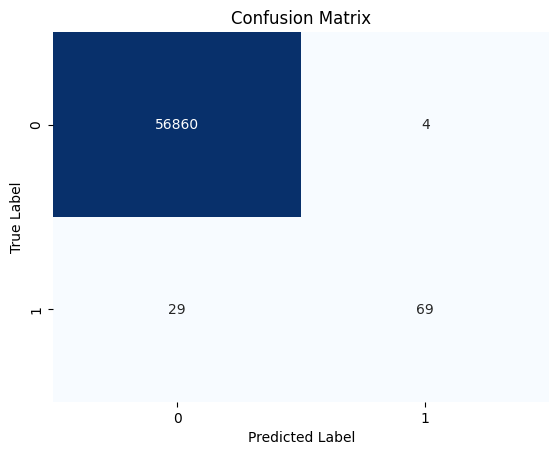

In [36]:
# Plot confusion matrix for ANN
plot_confusion_matrix(y_test, y_pred_ann)
# Evaluate ANN Model
ann_accuracy = accuracy_score(y_test, y_pred_ann)
ann_precision = precision_score(y_test, y_pred_ann)
ann_recall = recall_score(y_test, y_pred_ann)
ann_f1_score = f1_score(y_test, y_pred_ann)

In [37]:
print("\nANN Metrics:")
print(f"Accuracy: {ann_accuracy}")
print(f"Precision: {ann_precision}")
print(f"Recall: {ann_recall}")
print(f"F1 Score: {ann_f1_score}")


ANN Metrics:
Accuracy: 0.999420666409185
Precision: 0.9452054794520548
Recall: 0.7040816326530612
F1 Score: 0.8070175438596491


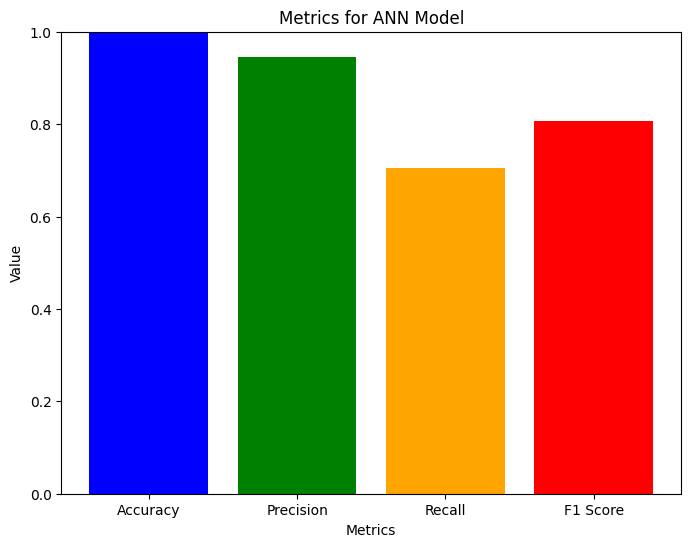

In [38]:
# Metrics values
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
values = [ann_accuracy, ann_precision, ann_recall, ann_f1_score]

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'green', 'orange', 'red'])
plt.title('Metrics for ANN Model')
plt.xlabel('Metrics')
plt.ylabel('Value')
plt.ylim(0, 1)  # Limit y-axis to range between 0 and 1
plt.show()

ROC Curve: 
The ROC curve and the associated AUC (Area Under the Curve) metric provide a comprehensive evaluation of the model's performance across different classification thresholds. This helps in understanding the trade-off between true positive rate and false positive rate.

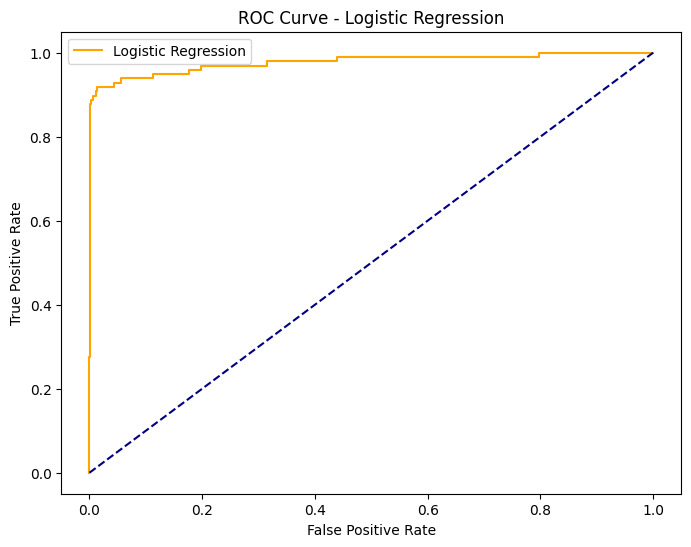

In [39]:
# ROC Curve for Logistic Regression
lr_probs = lr_model.predict_proba(X_test)[:, 1]
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_probs)

plt.figure(figsize=(8, 6))
plt.plot(fpr_lr, tpr_lr, color='orange', label='Logistic Regression')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Logistic Regression')
plt.legend()
plt.show()

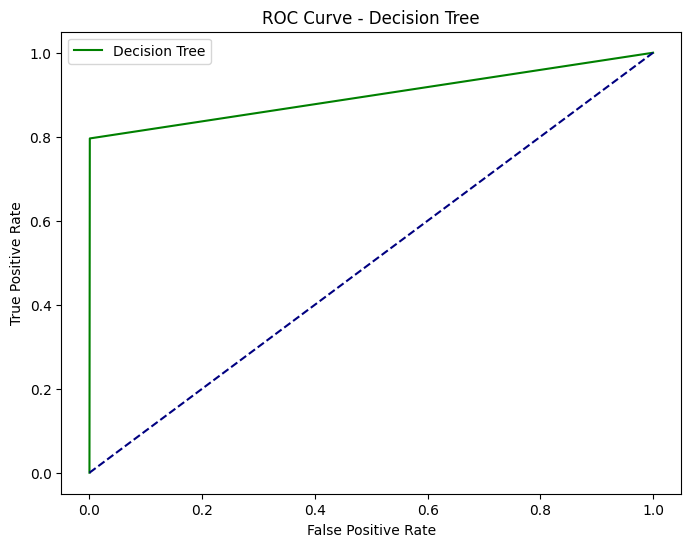

In [40]:
# ROC Curve for Decision Tree
dt_probs = dt_model.predict_proba(X_test)[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt_probs)

plt.figure(figsize=(8, 6))
plt.plot(fpr_dt, tpr_dt, color='green', label='Decision Tree')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend()
plt.show()

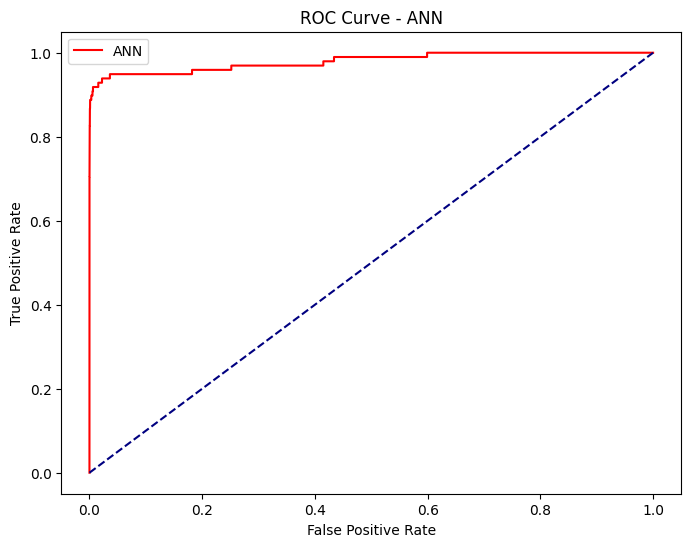

In [41]:
# ROC Curve for ANN
ann_probs = ann_model.predict_proba(X_test)[:, 1]
fpr_ann, tpr_ann, _ = roc_curve(y_test, ann_probs)

plt.figure(figsize=(8, 6))
plt.plot(fpr_ann, tpr_ann, color='red', label='ANN')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - ANN')
plt.legend()
plt.show()

Precision-Recall Curve: 
Precision-recall curves provide a different perspective on model performance, especially in imbalanced datasets, by illustrating the trade-off between precision and recall at different classification thresholds.

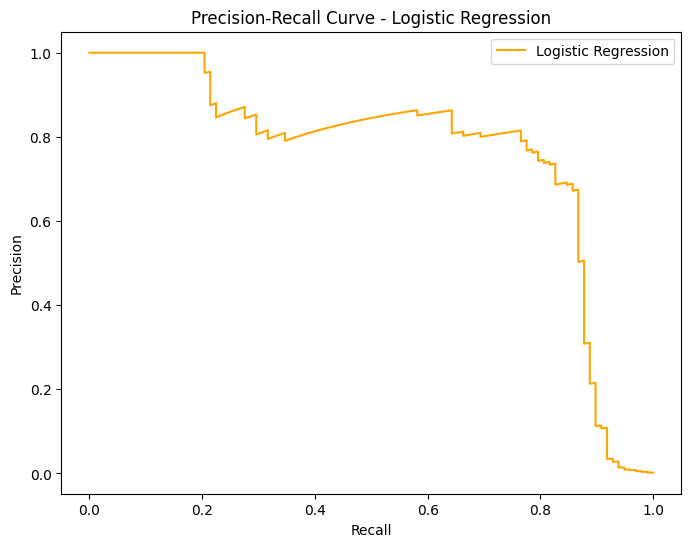

In [42]:
# Precision-Recall Curve for Logistic Regression
precision_lr, recall_lr, _ = precision_recall_curve(y_test, lr_probs)

plt.figure(figsize=(8, 6))
plt.plot(recall_lr, precision_lr, color='orange', label='Logistic Regression')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Logistic Regression')
plt.legend()
plt.show()

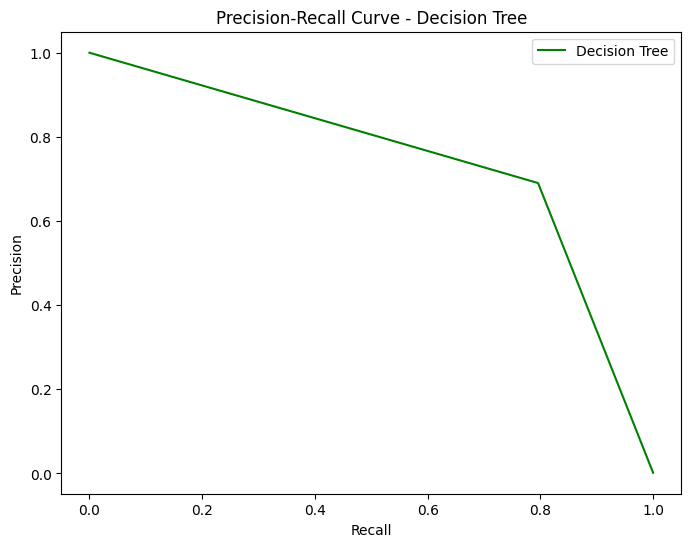

In [43]:
# Precision-Recall Curve for Decision Tree
precision_dt, recall_dt, _ = precision_recall_curve (y_test, dt_probs)

plt.figure(figsize=(8, 6))
plt.plot(recall_dt, precision_dt, color='green', label='Decision Tree')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Decision Tree')
plt.legend()
plt.show()

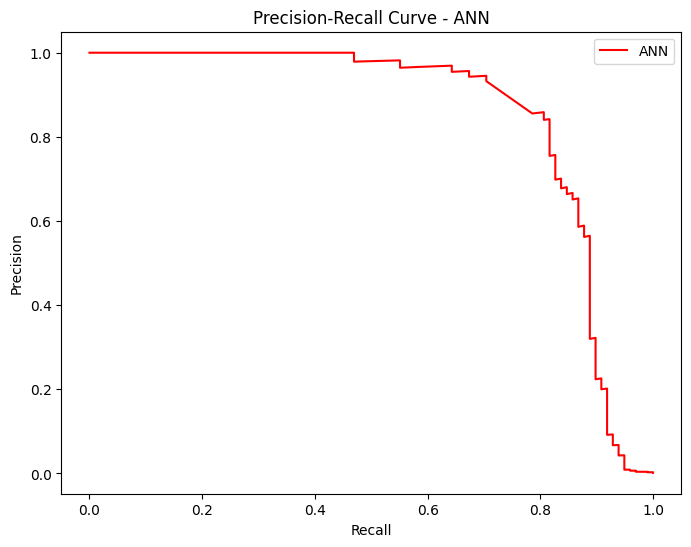

In [44]:
# Precision-Recall Curve for ANN
precision_ann, recall_ann, _ = precision_recall_curve(y_test, ann_probs)

plt.figure(figsize=(8, 6))
plt.plot(recall_ann, precision_ann, color='red', label='ANN')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - ANN')
plt.legend()
plt.show()

LIME Interpretation: 
LIME (Local Interpretable Model-agnostic Explanations) provides insights into individual predictions made by the models, helping in understanding the factors influencing model decisions and improving transparency and trustworthiness.

In [45]:
# Use LIME for Logistic Regression Model interpretation
explainer_lr = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                      mode="classification", 
                                                      feature_names=X_train.columns.tolist(),
                                                      class_names=['Non-Fraud', 'Fraud'])
exp_lr_sample_1 = explainer_lr.explain_instance(X_test.iloc[0].values, lr_model.predict_proba, num_features=5)
exp_lr_sample_2 = explainer_lr.explain_instance(X_test.iloc[1].values, lr_model.predict_proba, num_features=5)

# Print LIME interpretation for Logistic Regression Model
print("LIME interpretation for Logistic Regression Model - Sample 1:")
print(exp_lr_sample_1.as_list())
print("\nLIME interpretation for Logistic Regression Model - Sample 2:")
print(exp_lr_sample_2.as_list())

# Use LIME for Decision Tree Model interpretation
explainer_dt = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                      mode="classification", 
                                                      feature_names=X_train.columns.tolist(),
                                                      class_names=['Non-Fraud', 'Fraud'])
exp_dt_sample_1 = explainer_dt.explain_instance(X_test.iloc[0].values, dt_model.predict_proba, num_features=5)
exp_dt_sample_2 = explainer_dt.explain_instance(X_test.iloc[1].values, dt_model.predict_proba, num_features=5)

# Print LIME interpretation for Decision Tree Model
print("\nLIME interpretation for Decision Tree Model - Sample 1:")
print(exp_dt_sample_1.as_list())
print("\nLIME interpretation for Decision Tree Model - Sample 2:")
print(exp_dt_sample_2.as_list())

# Use LIME for ANN Model interpretation# Use LIME for ANN Model interpretation
explainer_ann = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode="classification", 
                                                       feature_names=X_train.columns.tolist(),
                                                       class_names=['Non-Fraud', 'Fraud'])
exp_ann_sample_1 = explainer_ann.explain_instance(X_test.iloc[0].values, ann_model.predict_proba, num_features=5)
exp_ann_sample_2 = explainer_ann.explain_instance(X_test.iloc[1].values, ann_model.predict_proba, num_features=5)


# Print LIME interpretation for ANN Model
print("\nLIME interpretation for ANN Model - Sample 1:")
print(exp_ann_sample_1.as_list())
print("\nLIME interpretation for ANN Model - Sample 2:")
print(exp_ann_sample_2.as_list())

LIME interpretation for Logistic Regression Model - Sample 1:
[('V4 > 0.74', 0.003298095655851667), ('V14 <= -0.43', 0.003017731331035165), ('V10 <= -0.54', 0.0024106890020419497), ('V21 > 0.19', 0.0021031019577390734), ('Time <= -0.86', 0.0019658510291818997)]

LIME interpretation for Logistic Regression Model - Sample 2:
[('V4 <= -0.85', -0.0009468356133346855), ('V10 <= -0.54', 0.0007274798080472814), ('V22 <= -0.54', -0.0005526094309497168), ('Time <= -0.86', 0.0005249274582462785), ('V16 <= -0.47', 0.00043468458469896)]

LIME interpretation for Decision Tree Model - Sample 1:
[('V20 <= -0.21', 0.10816846300948108), ('V3 <= -0.89', -0.032441689164876865), ('V1 <= -0.92', -0.029991359067096147), ('V8 > 0.33', 0.01345024104287135), ('V2 > 0.80', 0.013330105456235952)]

LIME interpretation for Decision Tree Model - Sample 2:
[('V20 > 0.13', -0.03962453996640641), ('0.02 < V1 <= 1.32', 0.016681054639664416), ('V6 > 0.40', 0.010857452667719161), ('-0.89 < V3 <= 0.18', 0.0106756724523080

In [46]:
# Show LIME interpretations as images for Logistic Regression Model
print("LIME interpretation for Logistic Regression Model - Sample 1:")
exp_lr_sample_1.show_in_notebook()
print("\nLIME interpretation for Logistic Regression Model - Sample 2:")
exp_lr_sample_2.show_in_notebook()

# Show LIME interpretations as images for Decision Tree Model
print("\nLIME interpretation for Decision Tree Model - Sample 1:")
exp_dt_sample_1.show_in_notebook()
print("\nLIME interpretation for Decision Tree Model - Sample 2:")
exp_dt_sample_2.show_in_notebook()

# Show LIME interpretations as images for ANN Model
print("\nLIME interpretation for ANN Model - Sample 1:")
exp_ann_sample_1.show_in_notebook()
print("\nLIME interpretation for ANN Model - Sample 2:")
exp_ann_sample_2.show_in_notebook()


LIME interpretation for Logistic Regression Model - Sample 1:



LIME interpretation for Logistic Regression Model - Sample 2:



LIME interpretation for Decision Tree Model - Sample 1:



LIME interpretation for Decision Tree Model - Sample 2:



LIME interpretation for ANN Model - Sample 1:



LIME interpretation for ANN Model - Sample 2:


Saving Models:
Saving trained models allows for their reuse or deployment in production environments without the need for retraining. It is an essential step in model lifecycle management.

In [47]:
# Specify the model directory
MODEL_DIR = "C:/Users/sowjanya/Desktop/credit_card_fraud_detection/model"

# Save the Logistic Regression Model
with open(f"{MODEL_DIR}/logistic_regression_model.pkl", "wb") as lr_file:
    pickle.dump(lr_model, lr_file)

# Save the Decision Tree Model
with open(f"{MODEL_DIR}/decision_tree_model.pkl", "wb") as dt_file:
    pickle.dump(dt_model, dt_file)

# Save the ANN Model
with open(f"{MODEL_DIR}/ann_model.pkl", "wb") as ann_file:
    pickle.dump(ann_model, ann_file)